# Multiobjective Portfolio Optimization

**Objective:** This notebook demonstrates how to use multiobjective optimization techniques to find optimal asset allocations for a portfolio. We will be using historical stock price data and the `pymoo` library to find a set of Pareto-optimal portfolios.

### 0. Multiobjective Optimization

Read [Mario meets Pareto](https://www.mayerowitz.io/blog/mario-meets-pareto) to understand multiobjective optimization.

### 1. Setup and Data Loading

First, install `pymoo`

In [18]:
# ! pip install pymoo

Import the necessary libraries:

In [19]:
import pandas as pd
import numpy as np
from pymoo.util.remote import Remote
import matplotlib.pyplot as plt

Next, configure `Plotly` as the default plotting backend for `Pandas`:

In [20]:
pd.options.plotting.backend = "plotly"

Download the example dataset provided by pymoo:

In [21]:
file = Remote.get_instance().load("examples", "portfolio_allocation.csv", to=None)
df = pd.read_csv(file, parse_dates=True, index_col="date")

The dataset portfolio_allocation.csv contains historical adjusted closing prices for multiple tickers, indexed by date. We will refer to df.columns (e.g., GOOG, AAPL) as the asset tickers in our portfolio.

### 2. Initial Data Visualization

Visualize the price series for all tickers:

In [22]:
df.plot()

*Note:* The index is business days (trading days only). There are no weekend rows.

In [23]:
df.head()

,GOOG,AAPL,FB,BABA,AMZN,GE,AMD,WMT,BAC,GM,T,UAA,SHLD,XOM,RRC,BBY,MA,PFE,JPM,SBUX
date,,,,,,,,,,,,,,,,,,,,
1989-12-29,NaN,0.117203,NaN,NaN,NaN,0.352438,3.9375,3.486070,1.752478,NaN,2.365775,NaN,NaN,1.766756,NaN,0.166287,NaN,0.110818,1.827968,NaN
1990-01-02,NaN,0.123853,NaN,NaN,NaN,0.364733,4.1250,3.660858,1.766686,NaN,2.398184,NaN,NaN,1.766756,NaN,0.173216,NaN,0.113209,1.835617,NaN
1990-01-03,NaN,0.124684,NaN,NaN,NaN,0.364050,4.0000,3.660858,1.780897,NaN,2.356516,NaN,NaN,1.749088,NaN,0.194001,NaN,0.113608,1.896803,NaN
1990-01-04,NaN,0.125100,NaN,NaN,NaN,0.362001,3.9375,3.641439,1.743005,NaN,2.403821,NaN,NaN,1.731422,NaN,0.190537,NaN,0.115402,1.904452,NaN
1990-01-05,NaN,0.125516,NaN,NaN,NaN,0.358586,3.8125,3.602595,1.705114,NaN,2.287973,NaN,NaN,1.722587,NaN,0.190537,NaN,0.114405,1.912100,NaN


This plot shows the historical price evolution of each stock. Note that raw prices exhibit non-stationary behavior, so we typically work with returns rather than prices.

Calculate daily returns (percentage change) and drop any rows where all values are missing:

In [24]:
returns = df.pct_change().dropna(how="all")
returns.plot()

Returns appear more "stationary" (they resemble random noise), which is why they are used for risk and return calculations.

In [25]:
returns.head(10)

,GOOG,AAPL,FB,BABA,AMZN,GE,AMD,WMT,BAC,GM,T,UAA,SHLD,XOM,RRC,BBY,MA,PFE,JPM,SBUX
date,,,,,,,,,,,,,,,,,,,,
1990-01-02,NaN,0.056739,NaN,NaN,NaN,0.034886,0.047619,0.050139,0.008107,NaN,0.013699,NaN,NaN,0.000000,NaN,0.041669,NaN,0.021576,0.004184,NaN
1990-01-03,NaN,0.006710,NaN,NaN,NaN,-0.001873,-0.030303,0.000000,0.008044,NaN,-0.017375,NaN,NaN,-0.010000,NaN,0.119995,NaN,0.003524,0.033333,NaN
1990-01-04,NaN,0.003336,NaN,NaN,NaN,-0.005628,-0.015625,-0.005304,-0.021277,NaN,0.020074,NaN,NaN,-0.010100,NaN,-0.017856,NaN,0.015791,0.004033,NaN
1990-01-05,NaN,0.003325,NaN,NaN,NaN,-0.009434,-0.031746,-0.010667,-0.021739,NaN,-0.048193,NaN,NaN,-0.005103,NaN,0.000000,NaN,-0.008639,0.004016,NaN
1990-01-08,NaN,0.006621,NaN,NaN,NaN,0.005714,0.000000,0.013477,0.005555,NaN,0.016877,NaN,NaN,0.015384,NaN,-0.072726,NaN,-0.008706,0.000000,NaN
1990-01-09,NaN,-0.009870,NaN,NaN,NaN,-0.020833,0.016393,-0.026596,0.000000,NaN,-0.022821,NaN,NaN,-0.020201,NaN,0.000000,NaN,-0.021092,-0.031999,NaN
1990-01-10,NaN,-0.043189,NaN,NaN,NaN,0.001934,-0.016129,0.000000,-0.019336,NaN,-0.027601,NaN,NaN,0.005154,NaN,-0.019606,NaN,0.017952,-0.004133,NaN
1990-01-11,NaN,-0.041664,NaN,NaN,NaN,0.000000,0.016393,0.010929,-0.008451,NaN,0.008734,NaN,NaN,0.005129,NaN,-0.020004,NaN,-0.010583,-0.012447,NaN
1990-01-12,NaN,0.000000,NaN,NaN,NaN,-0.025099,-0.032258,-0.037837,-0.028410,NaN,-0.030303,NaN,NaN,-0.025511,NaN,-0.020406,NaN,-0.017824,-0.008403,NaN


### 3. Estimating Expected Investment Returns

We compute the annualized expected return $\mu_i$ for each asset $i$ using geometric (compound) returns:

In [26]:
mu = (1 + returns).prod() ** (252 / returns.count()) - 1

In [60]:
mu.shape

(20,)

**Explanation of the formula:**
1. $(1 + r_t)$ for each return $r_t$ gives the daily growth factor.
2. $\prod_{t=1}^{T}(1 + r_t)$ computes the total growth factor over $T$ trading days.
3. Dividing the exponent by $T$ and multiplying by 252 (approximate trading days per year, we need to take weekends into account) annualizes this compound growth:
$$\mu_i = \left(\prod_{t=1}^{T}(1 + r_{i,t})\right)^{\frac{252}{T}} - 1$$
4. Subtracting 1 converts the compound multiplier back to a percentage return.

Plot the annualized returns for each asset:

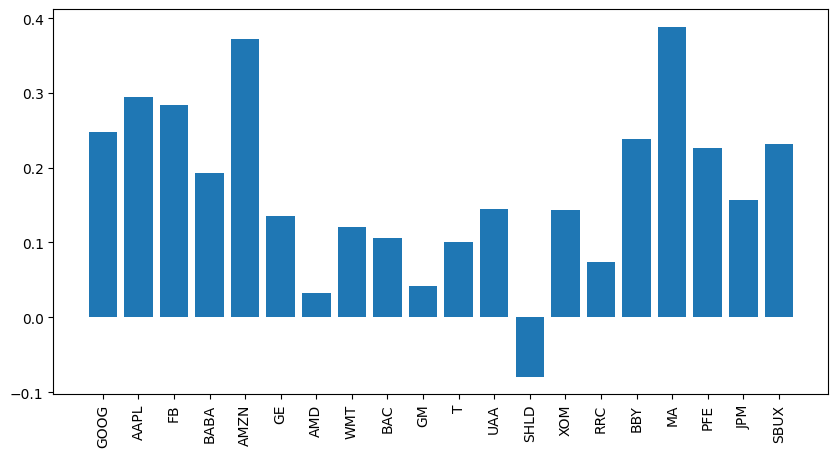

In [27]:
labels = df.columns

fig, ax = plt.subplots(figsize=(10, 5))
k = np.arange(len(mu))
ax.bar(k, mu)
ax.set_xticks(k, labels, rotation = 90)
plt.show()

### 4. Estimating Risk and Correlation

Calculate the annualized covariance matrix $\Sigma$ of returns:

In [28]:
cov = returns.cov() * 252 # Covariance scaled to annual
# calculates the covariance between columns (that is between companies)

Compute and visualize the correlation between asset returns:

Text(0.5, 1.0, 'Correlation Matrix')

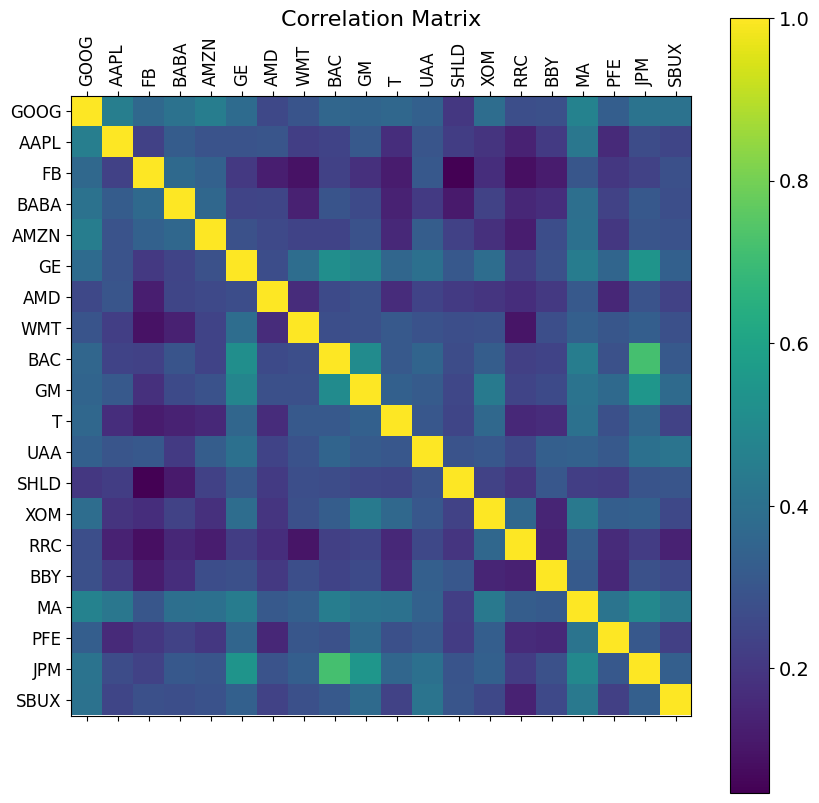

In [29]:
f = plt.figure(figsize=(10, 10))
plt.matshow(returns.corr(), fignum=f.number)
plt.xticks(k, labels, fontsize=12, rotation=90)
plt.yticks(k, labels, fontsize=12)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)

The covariance tells us how two assets co-vary (in units of variance). The correlation is simply the covariance standardized by the product of standard deviations. Here, we plot the correlation so that values lie between −1 and +1, making it easier to spot diversification benefits.

A lower correlation between two assets suggests they provide better diversification benefits. You can inspect this matrix to identify pairs of assets operating in different industries (e.g., technology vs. consumer staples) with low correlations.

In [30]:
mu, cov = mu.to_numpy(), cov.to_numpy()

### 5. Defining the Optimization Problem

We construct a multiobjective optimization problem with two objectives:
1. Minimize portfolio risk.
2. Maximize portfolio return (by minimizing negative return).

### Mathematical Formulation of the Portfolio Problem
Consider a portfolio of $n$ assets. We denote:

- $x = (x_1, x_2, \ldots, x_n)^\top$ as the vector of portfolio weights, where $x_i$ is the fraction of total capital invested in asset $i$.
- $\mu = (\mu_1, \mu_2, \ldots, \mu_n)^\top$ as the vector of annualized expected returns for each asset.
- $\Sigma \in \mathbb{R}^{n \times n}$ as the annualized covariance matrix of asset returns.
- $r_f$ as the annual risk-free rate (default $r_f = 0.02$).

### Objective Functions

We formulate a multi-objective problem with two objectives:

1. **Minimize portfolio risk (annualized volatility)**  
   Let
   $$f_1(x) \;=\; \underbrace{\sqrt{x^\top\,\Sigma\,x}}_{\text{portfolio standard deviation}}.$$
   This quantity is the annualized standard deviation of the portfolio's returns.

2. **Maximize portfolio return**  
   Equivalently, minimize the negative of the expected return:
   $$f_2(x) \;=\; -\,\underbrace{\bigl(\mu^\top\,x\bigr)}_{\text{expected annual return}}.$$
   Since most multi-objective solvers assume a minimization format, we define the second objective as $-\,\mu^\top x$.

Hence, the multi-objective vector is

$$F(x) \;=\; \bigl[f_1(x),\,f_2(x)\bigr]
\;=\;\Bigl[\sqrt{x^\top\Sigma\,x},\;-\mu^\top x\Bigr].$$

### Constraints

1. **Budget Constraint (weights sum to 1):**  
   $$\sum_{i=1}^{n} x_i = 1.$$

2. **Box Constraints (no short-selling, no leverage):**  
   $$0 \;\leq\; x_i \;\leq\; 1, 
   \quad 
   \forall\,i = 1,2,\ldots,n.$$

3. **Practical Thresholding (small-weight trimming):**  
   In practice, any $x_i < 0.001$ (i.e., below 0.1% of the portfolio) is set to zero and then the remaining weights are renormalized to sum to 1. Mathematically, this means:
   $$\tilde{x}_i =
   \begin{cases}
   0, & x_i < 10^{-3},\\
   x_i, & x_i \geq 10^{-3},
   \end{cases}
   \quad
   \text{then renormalize } \tilde{x} \text{ so that } \sum_{i} \tilde{x}_i = 1.$$
   This ensures that very small positions are eliminated and the budget constraint is restored.

### Full Optimization Problem

Putting everything together, we can write:

$$\begin{aligned}
\text{Find } x \in \mathbb{R}^n \quad &\text{that minimizes } 
\;F(x) = \Bigl[\sqrt{x^\top \Sigma\,x},\, -\,\mu^\top x\Bigr],\\
\text{subject to:}
\quad
&\sum_{i=1}^n x_i = 1,\\
&0 \;\leq\; x_i \;\leq\; 1, \quad i = 1,\ldots,n.
\end{aligned}$$

After each candidate $x$ is generated by the optimizer, a repair step enforces:

1. $x_i \leftarrow 0$ for all $i$ such that $x_i < 10^{-3}$.
2. $x \leftarrow \displaystyle \frac{x}{\sum_{i=1}^n x_i}$ to restore $\sum_{i} x_i = 1$.

In [31]:
from pymoo.core.problem import ElementwiseProblem
import numpy as np
from typing import Any

class PortfolioProblem(ElementwiseProblem):
    """
    Portfolio optimization problem for multi-objective optimization.
    
    This class defines a portfolio optimization problem that minimizes risk (volatility)
    while maximizing expected return.
    """

    def __init__(self, mu: np.ndarray, cov: np.ndarray, **kwargs: Any) -> None:
        """
        Initialize the portfolio optimization problem.
        
        Args:
            mu: Expected returns for each asset (1D array)
            cov: Covariance matrix of asset returns (2D array)
            **kwargs: Additional arguments passed to parent class
        """
        super().__init__(n_var=len(df.columns), n_obj=2, xl=0.0, xu=1.0, **kwargs)
        self.mu = mu
        self.cov = cov

    def _evaluate(self, x: np.ndarray, out: dict[str, Any], *args: Any, **kwargs: Any) -> None:
        """
        Evaluate portfolio performance for given weights.
        
        Args:
            x: Portfolio weights (must sum to 1)
            out: Output dictionary to store objective values and metrics
            *args: Additional positional arguments
            **kwargs: Additional keyword arguments
        """
        # TODO: Implement F function
        # Note: We'll handle constraints in the repair method. Do not worry about constraints here.
        f1 = np.sqrt(x.T @ self.cov @ x)
        f2 = -(self.mu.T @ x)
        # Note: This method do not return anything.
        # Instead it should store the objectives in out["F"]
        out["F"] = [f1, f2]

### Handling Constraints

We handle constraints by applying repair function that repairs solutions that are not feasible.

In [32]:
from pymoo.core.repair import Repair


class PortfolioRepair(Repair):
    """
    Portfolio repair mechanism for multi-objective optimization.

    This repair operator ensures that portfolio weights satisfy practical constraints:
    1. Portfolio weights sum to 100% (normalized to 1.0)
    2. Very small weights (< 0.1%) are set to zero to avoid impractical allocations

    The rationale is that investment weights must total 100% and very small fractions
    of investment don't make practical sense in real portfolio management.
    """

    def _do(
        self, problem: ElementwiseProblem, X: np.ndarray, **kwargs: Any
    ) -> np.ndarray:
        """
        Repair portfolio weights to satisfy normalization and minimum threshold constraints.

        Args:
            problem: The optimization problem instance (unused but required by interface)
            X: Portfolio weight matrix where each row represents a portfolio solution
            **kwargs: Additional keyword arguments

        Returns:
            Repaired portfolio weights matrix with proper normalization and thresholding
        """
        # X is a 2D array: each row is a candidate weight vector
        # For each row:
        #   a) Set weights < 0.001 to zero
        #   b) Make sure that sum(weights) == 1.0
        #   c) Return the repaired X matrix
        X[X < 0.001] = 0
        return X / X.sum(axis=1, keepdims=True)
        

### 6. Running the Multiobjective Optimization

We use the SMS-EMOA algorithm from pymoo to obtain the Pareto front of optimal trade-offs between risk and return.

In [33]:
from pymoo.algorithms.moo.sms import SMSEMOA
from pymoo.optimize import minimize

problem = PortfolioProblem(mu, cov)

algorithm = SMSEMOA(repair=PortfolioRepair())

res = minimize(problem, algorithm, seed=1, verbose=False)

Upon convergence, `res.opt.get("X", "F")` returns:
- X: Pareto-optimal weight matrices (each row is a portfolio).
- F: Corresponding objective values ([risk, –return]).

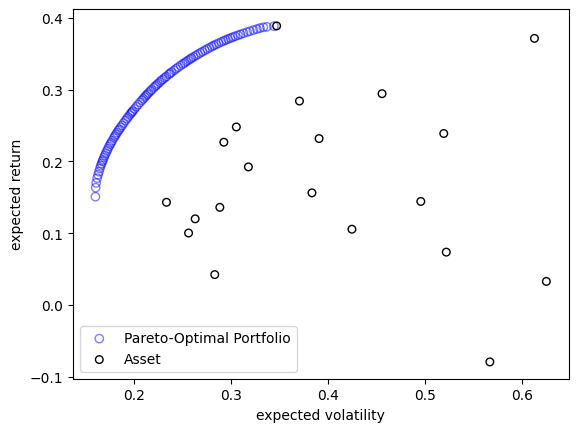

In [34]:
X, F = res.opt.get("X", "F")
F = F * [1, -1]

plt.scatter(F[:, 0], F[:, 1], facecolor="none", edgecolors="blue", alpha=0.5, label="Pareto-Optimal Portfolio")
plt.scatter(cov.diagonal() ** 0.5, mu, facecolor="none", edgecolors="black", s=30, label="Asset")
plt.legend()
plt.xlabel("expected volatility")
plt.ylabel("expected return")
plt.show()

In this figure, each blue point is a portfolio on the Pareto front. The black points are the individual assets (their own risk–return coordinates). Notice that some portfolios lie ‘above’ all single assets (they achieve higher return for the same risk).

### Exercise 1

Visualize `X` using imshow. Analyze the visualization to determine which tickers are assigned non-zero weights. Identify the industries these companies belong to, and determine which company has the highest weight.

In [47]:
print('Portfolio weights:')
for portfolio in X:
    print(portfolio[:5])

Portfolio weights:
[0.03053161 0.03620327 0.13544312 0.12863525 0.        ]
[0.03892869 0.03537576 0.13204585 0.12037973 0.        ]
[0.00748253 0.0742518  0.22457047 0.0098793  0.06075269]
[0.         0.07491112 0.23319086 0.02913585 0.05515363]
[0.05072374 0.05346825 0.16343565 0.12115961 0.01053244]
[0.02287237 0.03132836 0.12065063 0.12654942 0.        ]
[0.05359179 0.06584585 0.17532607 0.0969716  0.02531451]
[0.03178568 0.071281   0.20686345 0.05667926 0.04992575]
[0.04489114 0.03519319 0.14981613 0.11378854 0.00117121]
[0.         0.0069622  0.11436944 0.11893933 0.        ]
[0.         0.00895588 0.18630541 0.         0.1134525 ]
[0.         0.         0.04958031 0.         0.12381521]
[0.03150726 0.06493711 0.20465347 0.08426676 0.04672772]
[0.         0.00128197 0.00829487 0.         0.12020142]
[0.         0.00833639 0.17400686 0.         0.10588234]
[0.04345295 0.0394394  0.14885485 0.11518582 0.00116656]
[0.         0.06946096 0.23413498 0.         0.06249316]
[0.         

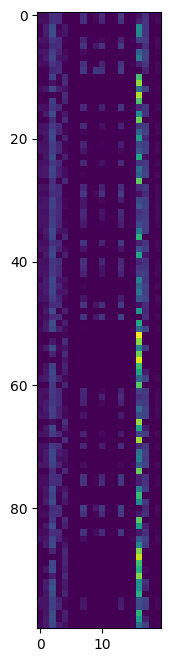

In [40]:
_, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(X, cmap='viridis')

<BarContainer object of 20 artists>

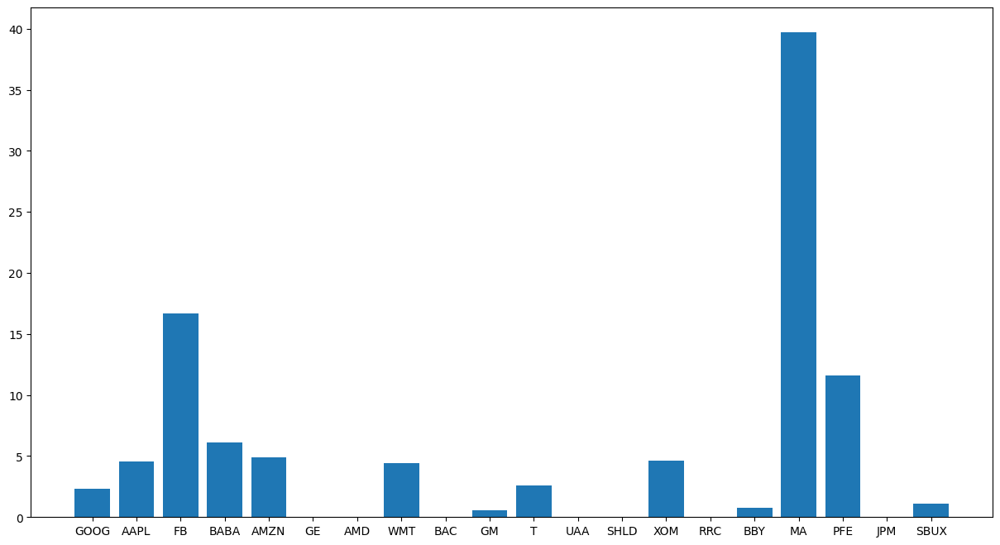

In [52]:
X_sum = np.sum(X, axis=0)

_, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.bar(df.columns, X_sum)

In [ ]:
X_sum = np.sum(X, axis=0)

_, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.bar(df.columns, X_sum)

<BarContainer object of 20 artists>

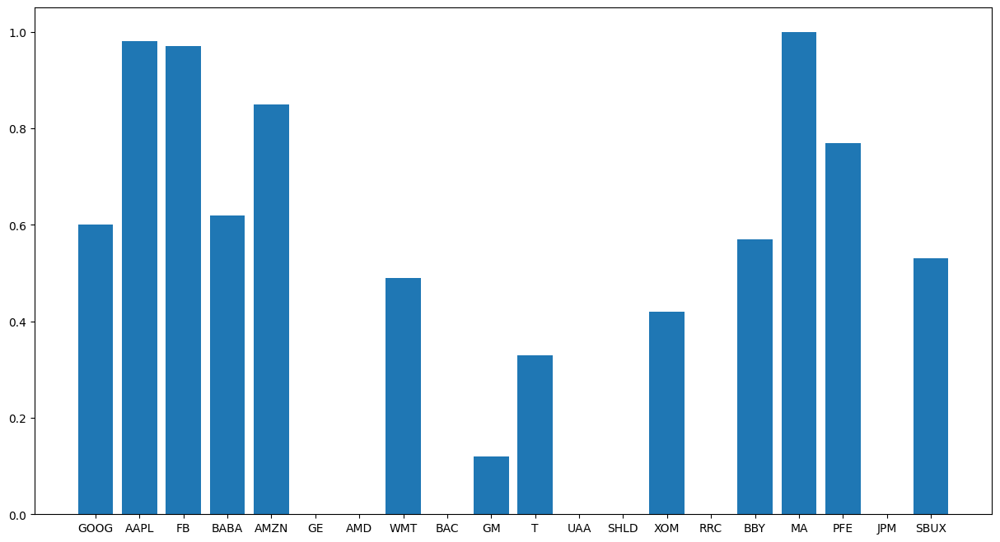

In [57]:
X_occurence = np.where(X > 0, 1, 0)
X_occurence = np.sum(X_occurence, axis=0)
X_occurence_norm = X_occurence / X.shape[0]

_, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.bar(df.columns, X_occurence_norm)

Na pierwszym histogramie zsumowałem wagi we wszystkich zwróconych portfelach dla każdej spółki. Im większa wartość, tym większą wagę zajmuje we wszystkich portfelach.
Widać, że są to spółki takie jak Mastercard, Facebook i Pfizer - oznacza to, że gwarantują dobry zwrot, przy ograniczonym ryzyku.

Drugi wykres przedstawia częstość występowania danej spółki w portfelu. Im większa wartosć, tym częściej znajduje się w wybranym portfelu. Trzeba jednak rozróżnić, że częstość nie oznacza dużej wagi. Przykładowo, firmy takie jak Apple, Amazon, Google znajdują się w dużej ilości portfelów, ale z bardzo małą wagą (wykres pierwszy). Oznacza to, że pewnie są dużo bardziej zmienne, jako firmy z sektora technologicznego. Gwarantują może większy zysk, ale kosztem zmienności.

### Exercise 2 
We want  to choose a single portfolio from the Pareto front. For this purpose we can use another metric -- Sharpe ratio:
- Compute Sharpe ratio for each Pareto portfolio:  
  $$\text{Sharpe}_j = \frac{\mu^\top x^{(j)} - r_f}{\sqrt{x^{(j)T} \Sigma x^{(j)}}}$$
  Where $r_f = 0.02$.  
- Plot Sharpe vs. risk or Sharpe vs. return, and identify the portfolio that maximizes Sharpe.  

In [62]:
def sharpe_ratio(x, mu, cov, r):
    num = mu.T @ x - r
    den = np.sqrt(x.T @ cov @ x)
    return num / den

In [64]:
r = 0.02
X_sharpe_ratio = np.apply_along_axis(lambda x: sharpe_ratio(x, mu, cov, r), axis=1, arr=X)
X_sharpe_ratio.shape

(100,)

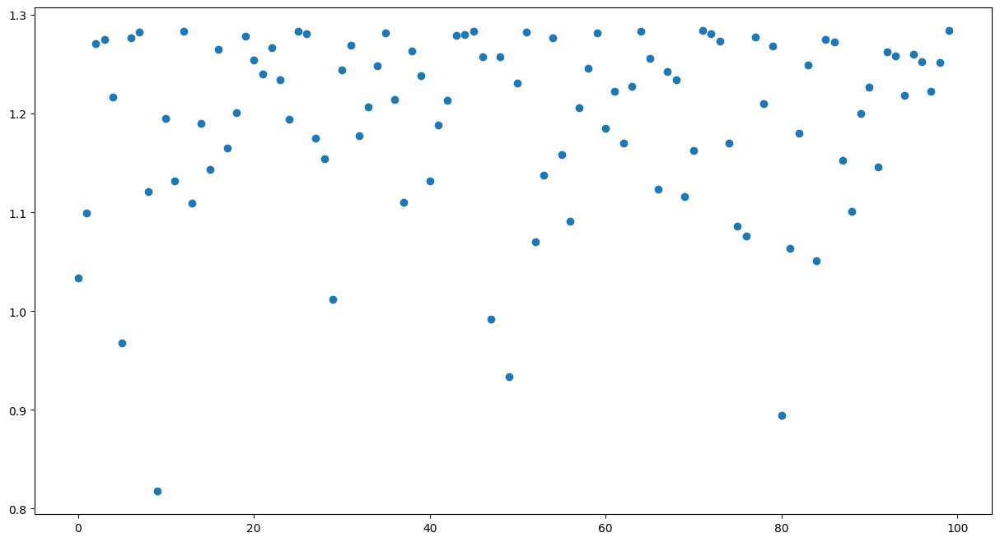

In [67]:
_, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.scatter(range(X.shape[0]), X_sharpe_ratio)

Best portfolio: #99  Sharpe=1.284  risk=0.222  return=0.305


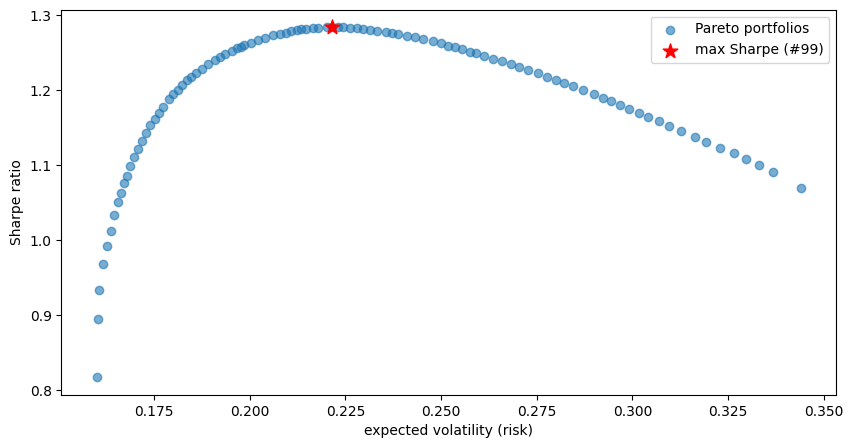

In [ ]:
r = 0.02
S = np.apply_along_axis(lambda x: sharpe_ratio(x, mu, cov, r), axis=1, arr=X)

best = int(np.argmax(S))
print(f"Best portfolio: #{best}  Sharpe={S[best]:.3f}  "
      f"risk={F[best,0]:.3f}  return={F[best,1]:.3f}")

fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(F[:, 0], S, alpha=0.6, label="Pareto portfolios")
ax.scatter(F[best, 0], S[best], color="red", s=120, marker="*", zorder=5,
           label=f"max Sharpe (#{best})")
ax.set_xlabel("expected volatility (risk)")
ax.set_ylabel("Sharpe ratio")
ax.legend()
plt.show()


### Exercise 3

In real-world portfolio management, you often face constraints beyond the basic budget and no short-selling rules. A common constraint is limiting the maximum exposure to any single asset to prevent over concentration.

Task:
1. Modify the PortfolioProblem to include an additional constraint: no single asset can account for more than 20% of the total portfolio weight.
2. Re-run the optimization with this new constraint.
3. Plot the new Pareto front and compare it with the original one. How does this constraint affect the available risk-return trade-offs?